32 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.
Fitting ICA to data using 32 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 32 components
Fitting ICA took 0.7s.


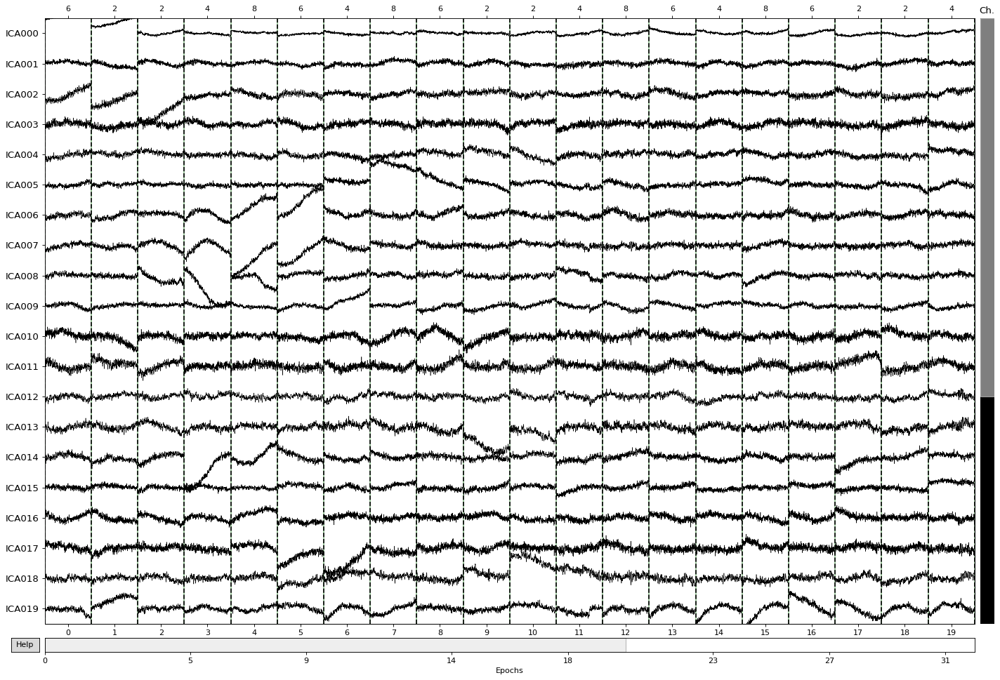

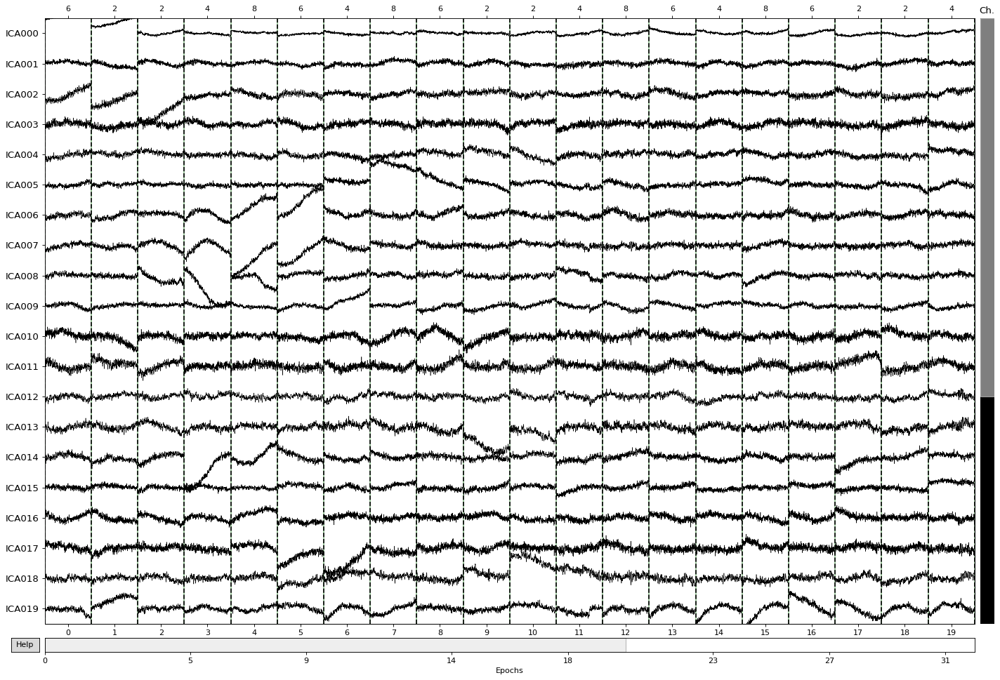

In [7]:
import h5py
import mne
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio

with h5py.File("../ssvep/data/multiple1.hdf5", "r") as f:

    data = f["RawData"]["Samples"].value[:, 1:].T


trialLabels = [6, 2, 2, 4, 8, 6, 4, 8] * 4

sFreq = 256
startTime = 7.73
startTimeIdx = int(np.floor(startTime * sFreq))
endTime = 252.94
endTimeIdx = int(np.floor(endTime * sFreq))
data = data[:, startTimeIdx : endTimeIdx + 1]

trialLength = 5
actualLength = 4
restLength = 2.5
longRestLength = 5

startOffset, endOffset = 0.5, 0.5


idx = 0
for i in range(len(trialLabels)):
    
    trials[i, :, :] = data[
        :,
        int((idx + startOffset) * sFreq) : int((idx + trialLength - endOffset) * sFreq),
    ]

    if ((i + 1) % 8) == 0:
        idx = idx + trialLength + longRestLength
    else:
        idx = idx + trialLength + restLength


channel_types = ["eeg"] * 32
info = mne.create_info(
    ch_names=[f"eeg{i}" for i in range(1, 33)], sfreq=sFreq, ch_types=channel_types
)
events = np.array([[i, 0, trialLabels[i]] for i in range(len(trialLabels))])

event_id = {"_6": 2, "_12": 4, "_7": 6, "_10": 8}


epochs = mne.EpochsArray(trials, info, events, event_id=event_id)

epochs.set_eeg_reference("average")

epochs.plot()


ica = mne.preprocessing.ICA()
ica.fit(epochs)
# ica.plot_overlay(eeg_evoked, exclude=[1, 2], picks="eeg")

# ica.exclude = [14, 15, 16, 22, 23, 24, 25, 26, 27]
#ica.plot_sources(epochs)

# reconst_epochs = epochs.copy()
# ica.apply(reconst_epochs)

